##**1η ομαδική εργασία.**

Αγγελος Λουκας 03119877

Αλεξανδρος Μαντζαφινης 03118057

ομάδα 31

##1. Θεωρητικό μέρος
a)
In the Gaussian Pyramid Generation process a function called `REDUCE` is used to create the next level of our Gaussian Pyramid. This function uses `w(m,n)=w(m)*w(n)` , `a` 5 by 5 pattern of weights called generating kernel that is normalized separately for `m` and `n` . The value a is then used to change the contribution of each node ( inside that 5 by 5 pattern ) for the construction of the next level of our Gaussian Pyramid. With a bigger value for our variable a we get a greater contribution of the center nodes and less for the outer ones.

b) Entropy of the pixel value distribution is defined as the minimum number of bits per pixel required to exactly encode the image. It is assumed that the pixel values of an image representation are statistically independent.
For a grayscale image the maximum entropy can be calculated like this: There are 256 gray levels ranging from 0 to 255, and if they are all equally likely which is when the maximum entropy would happen,then the result is log256 with base 2, which equals to 8.

c) In quantization the range of pixel values is divided into bins of size n. N is carefully selected so as not to create any visible changes to the image but must be big enough so that the quantization process produces good results.

d) The low-level pixels can be coarsely quantized in contrast with the higher level pixels where sample density is lower. As the Pyramid levels increase in number, more quantization levels must be used. 

##2. Εργαστηριακό μέρος

a)

In [ ]:
import numpy as np
import urllib.request
import cv2
from matplotlib import pyplot as plt
import urllib.request
import cv2
import scipy
import skimage
from skimage import data
from scipy.signal import convolve2d
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline


In [ ]:

N = 4 # Number of levels of the pyramid
a = 3/8 

In [ ]:

HTTP_response = urllib.request.urlopen('http://www.image.ntua.gr/~tpar/LABimage/lena.png') 

arr = np.asarray(bytearray(HTTP_response.read()), dtype=np.uint8)
BGR = cv2.imdecode(arr,-1)
Y = cv2.cvtColor(BGR, cv2.COLOR_BGR2YCrCb)[:,:,0]

In [ ]:
def GKernel1D(a, l):
    h = np.array([a, 1/4, 1/4-a/2])
    return h[np.abs(l)]

def GKernel(a):
    h = np.zeros((5, 5))
    for i in range(-2, 3):
        for j in range(-2, 3):
            h[i+2, j+2] = GKernel1D(a, i) * GKernel1D(a, j)
    return h

In [ ]:
def GREDUCE(I,h):
          reduced_downsampled = None
          low_pass_image = cv2.filter2D(I,-1,h)                 #We compare the image with the generated kernel
          reduced_downsampled = low_pass_image[::2,::2]         # We reduce the sampling rate to half
          return reduced_downsampled
      

256


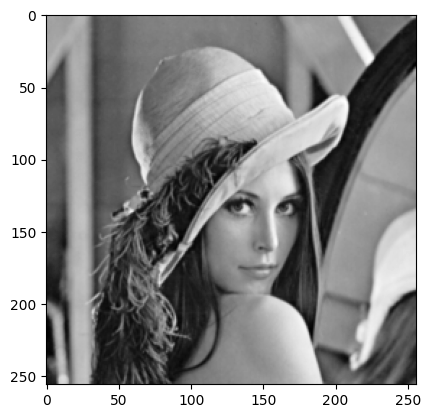

In [ ]:
h = GKernel(3/8)
reduced_lena = GREDUCE(Y,h)
plt.imshow(reduced_lena, cmap="gray")
print(len(reduced_lena))

In [ ]:
 def GPyramid(I,a,depth):
     pyramid = [I]
     kernel = GKernel(a)
     for i in range(0,depth-1):
        gaussian_image = GREDUCE(pyramid[i],kernel)    # We apply GREDUCE to the image on the previous level to get lowpass image on the next level
        pyramid.append(gaussian_image)
     return pyramid

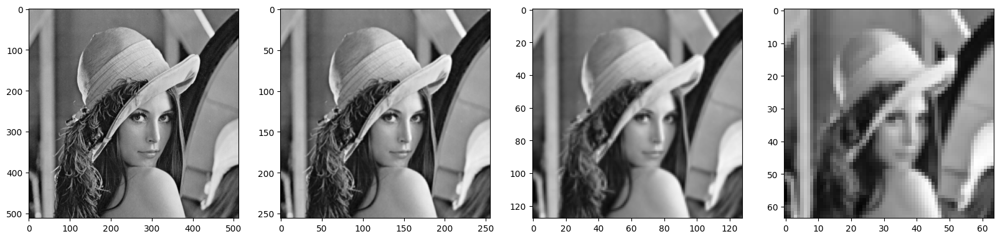

In [ ]:
pyramid = GPyramid(Y,3/8,4)
f, ax = plt.subplots(1, len(pyramid), figsize=(20, 20))
for i in range (0,len(pyramid)):
   ax[i].imshow(pyramid[i], cmap="gray")

In [ ]:
def GEXPAND(I,h):
          expanded_image = None
          if (len(I.shape)==2):                                                          # Grayscale image
            tmp_image = np.zeros((I.shape[0]*2, I.shape[1]*2), dtype=np.float64)         # We obtain a matrix with every other pixel the same as the original image, while the remaining pixels are zero
            tmp_image[::2,::2]=I                                                         # They will be used later to interpolate the new node values between the given values
          else:                                                                          # Image with colour
            tmp_image = np.zeros((I.shape[0]*2, I.shape[1]*2, I.shape[2]), dtype=np.float64)
            tmp_image[::2,::2,:]=I
          expanded_image = 4*cv2.filter2D(tmp_image,-1,h)                                
          return expanded_image

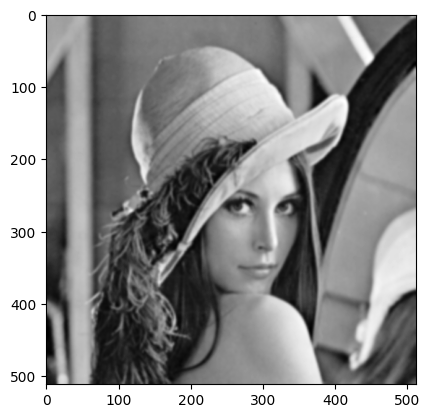

In [ ]:
EXP = GEXPAND(GREDUCE(Y,h),h)
plt.imshow(EXP, cmap="gray")


In [ ]:
def LPyramid(I,a,depth):
          gaussian_pyramid = GPyramid(I,a,depth)
          laplacian_pyramid = []                                                                    
          kernel = GKernel(a)                                                           # We obtain the generated kernel for the given value of the parameter a
          for i in range(0,depth-1):                                                
            gaussian_image = gaussian_pyramid[i]
            expanded_gaussian_image = GEXPAND(gaussian_pyramid[i+1],kernel)             # EXPAND the image of each level to get the same dimensions as the previous level
            laplacian_pyramid.append(gaussian_image - expanded_gaussian_image+128)      # We take the difference of the images, add 128 to get only positive values (center 128)
                                                                                        # Removed during reconstruction so as not to affect the results, required for screen printing
          laplacian_pyramid.append(gaussian_pyramid[depth-1])
          return laplacian_pyramid

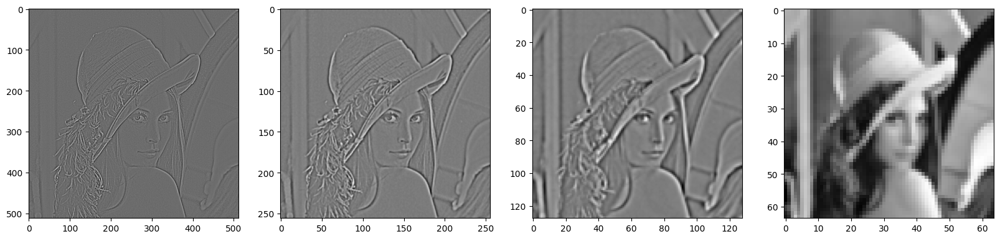

In [ ]:
LPyr = LPyramid(Y,3/8, 4)
f, ax = plt.subplots(1, len(LPyr), figsize=(20, 20))
for i in range (0,len(LPyr)):
   ax[i].imshow(LPyr[i], cmap="gray")

In [ ]:
def L_Pyramid_Decode(L,a):
            kernel = GKernel(a)
            sum_image=L[len(L)-1]
            for i in range(len(L)-2, -1, -1):
                expanded_image = GEXPAND(sum_image,kernel)                                # EXPAND image to get the same dimensions as the previous level
                sum_image=L[i]+expanded_image-128                                         # Sum of the previous level to the sum of the image calculated so far
            return sum_image   

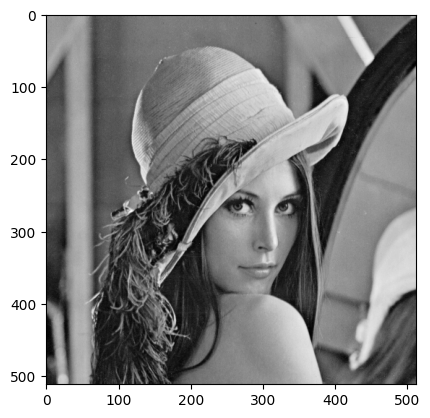

In [ ]:
DPyr = L_Pyramid_Decode(LPyr,3/8)
plt.imshow(DPyr, cmap="gray")

In [ ]:
def L_Quantization(L,bins):                                                       # Input parameters are the image to be quantized and the number of bins 
            if (len(L.shape)==2):                                                 # Grayscale image
                C=np.zeros((L.shape[0], L.shape[1]), dtype=np.float64)
                max_val=L.max()
                n=256/bins                                                        # Maximum value is 255, bin size calculation for n bins
                for i in range (0,L.shape[0]):                                    # For each pixel
                    for j in range(0,L.shape[1]):
                        for m in range(0,bins):
                            if (L[i][j]<=(m+1/2)*n and L[i][j]>=(m-1/2)*n):            
                                C[i][j]=m*n
                                break
            else:                                                                # Image with colour
                C=np.zeros((L.shape[0], L.shape[1],L.shape[2]), dtype=np.float64)
                max_val=L.max()
                n=255/bins                                                                # Μέγιστη τιμή είναι το 255, υπολογίζουμε το bin size για n bins\n",
                for i in range (0,L.shape[0]):                                            # For each pixel
                    for j in range(0,L.shape[1]):
                        for k in range(0,L.shape[2]):
                            for m in range(0,bins):
                                if (L[i][j][k]<=(m+1/2)*n and L[i][j][k]>=(m-1/2)*n):    
                                    C[i][j][k]=m*n
                                    break
            return C

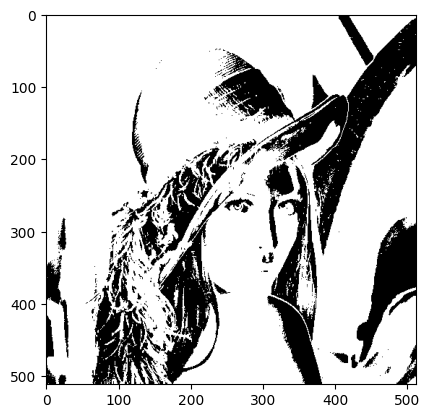

In [ ]:
Quant = L_Quantization(Y,2)
plt.imshow(Quant, cmap="gray")

##3o ΜΕΡΟΣ

a)

In [ ]:
HTTP_response = urllib.request.urlopen('http://www.image.ntua.gr/~tpar/LABimage/lena.png') 

arr = np.asarray(bytearray(HTTP_response.read()), dtype=np.uint8)
BGR = cv2.imdecode(arr,-1)
lenaY = cv2.cvtColor(BGR, cv2.COLOR_BGR2YCrCb)[:,:,0]
lenaCr = cv2.cvtColor(BGR, cv2.COLOR_BGR2YCrCb)[:,:,1]
lenaCb = cv2.cvtColor(BGR, cv2.COLOR_BGR2YCrCb)[:,:,2]

Lena_RGB = cv2.cvtColor(BGR, cv2.COLOR_BGR2RGB)

from skimage import data
Camera=skimage.data.camera()


<Figure size 600x600 with 0 Axes>

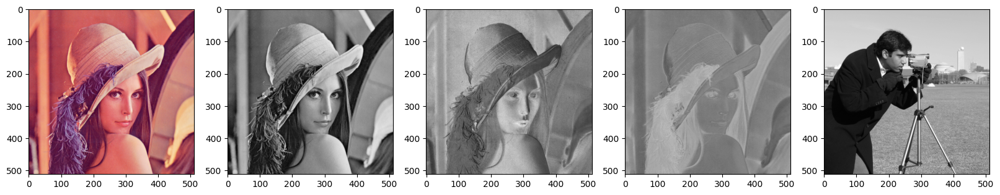

<Figure size 600x600 with 0 Axes>

In [ ]:
myimages=[Lena_RGB,lenaY,lenaCr,lenaCb,Camera]
f, ax = plt.subplots(1, len(myimages), figsize=(20, 20))
for i in range (0,len(myimages)):
   ax[i].imshow(myimages[i], cmap="gray")
plt.figure(figsize=(6, 6))

In [ ]:
def showPyramid(pyramid, case):
    if (case=='gray'):                                                           # Grayscale image
        f, ax = plt.subplots(1, len(pyramid), figsize=(20, 20))  
        for i in range (0,len(pyramid)):
            ax[i].imshow(pyramid[i], cmap="gray")                                # Pyramid level 0
            ax[i].set_title('Level {}'.format(i), fontsize=14)
    else:
        f, ax = plt.subplots(1, len(pyramid), figsize=(20, 20))                  # Image with colour
        for i in range (0,len(pyramid)):
            ax[i].imshow(pyramid[i].astype(int))                                 # Pyramid level 0
            ax[i].set_title('Level {}'.format(i), fontsize=14)


In [ ]:
GPyr_lap=[]
GPyr_dec=[]
a=3/8
depth=4

for i in range(len(myimages)):
  GPyr_lap.append(LPyramid(myimages[i], a, depth))      #create Laplace pyramid
  GPyr_dec.append(L_Pyramid_Decode(GPyr_lap[i],a))      #decode Laplace pyramid




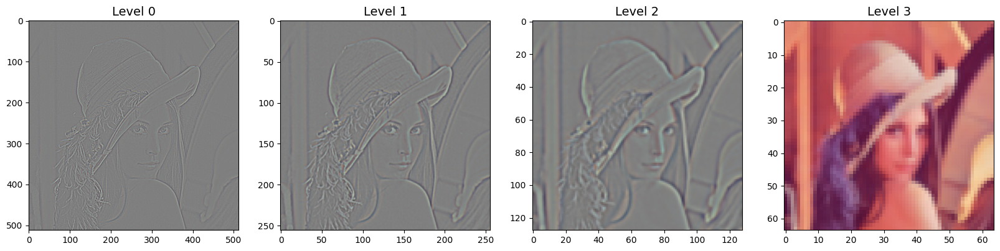

In [ ]:
showPyramid(GPyr_lap[0],"RGB")

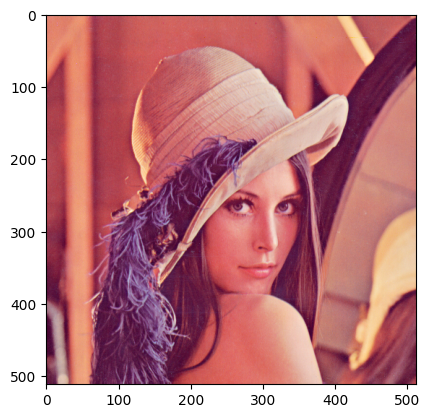

In [ ]:
plt.imshow(GPyr_dec[0].astype(int))

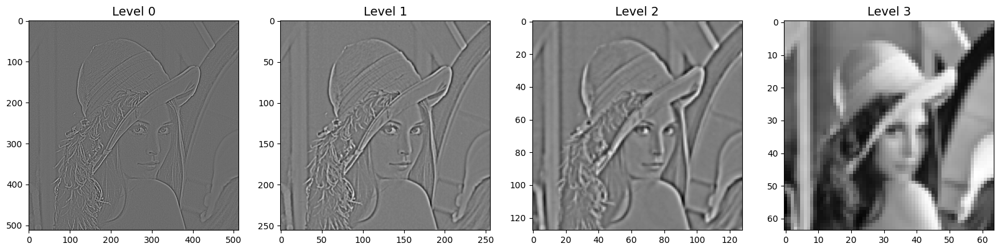

In [ ]:
showPyramid(GPyr_lap[1],"gray")

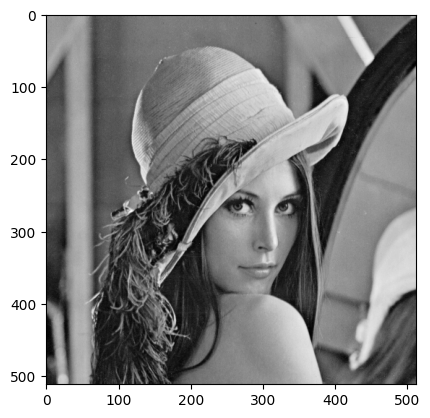

In [ ]:
plt.imshow(GPyr_dec[1],cmap='gray')

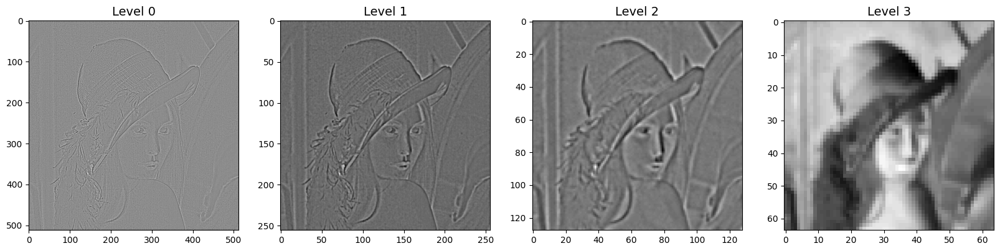

In [ ]:
showPyramid(GPyr_lap[2],"gray")

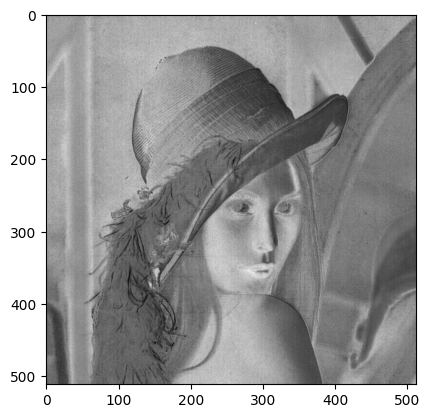

In [ ]:
plt.imshow(GPyr_dec[2],cmap='gray')

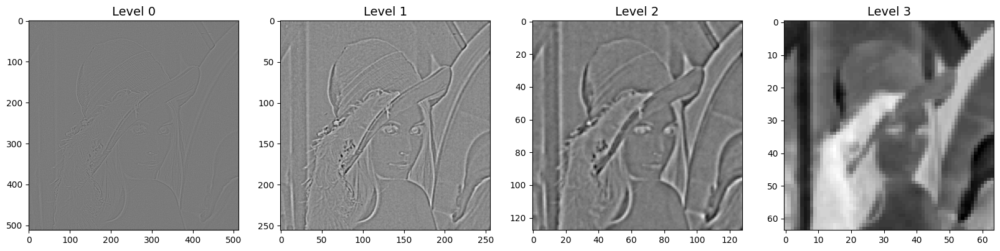

In [ ]:
showPyramid(GPyr_lap[3],"gray")

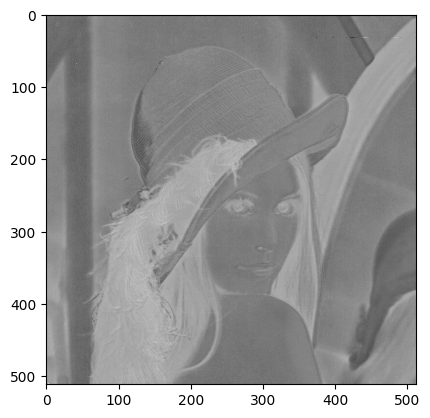

In [ ]:
plt.imshow(GPyr_dec[3],cmap='gray')

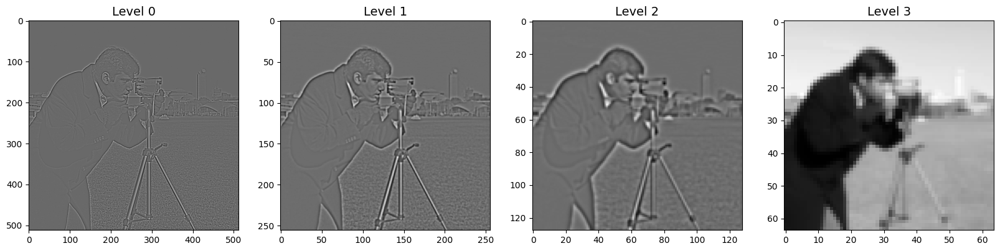

In [ ]:
showPyramid(GPyr_lap[4],"gray")

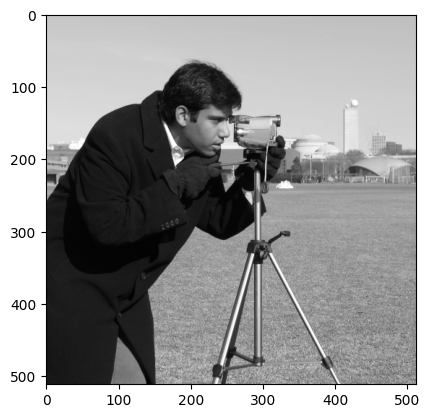

In [ ]:
plt.imshow(GPyr_dec[4],cmap='gray')

The images in the Laplacian pyramid appear to have strong details (e.g. edges). More specific details are less visible at lower levels. As we move on we see coarse features. This makes sense as each layer emerges as image detail with increasingly deeper spectra in the Gaussian pyramid.

b)


In [ ]:
#we will take one image that is Lena Y
depth=4
lena_lap_pyr=[]
decoded_lena=[]
for a in range(3,8,1):
  temp=LPyramid(myimages[1],a/10,depth)
  lena_lap_pyr.append(temp)
  decoded_lena.append(L_Pyramid_Decode(temp,a/10))

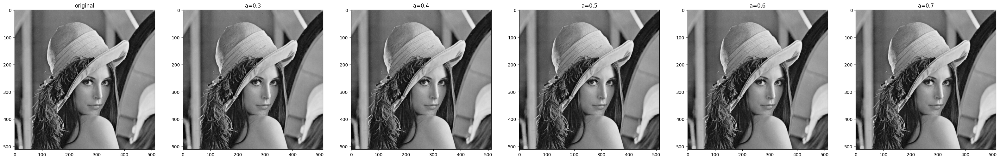

In [ ]:
fig,ax=plt.subplots(1,6,figsize=(40,40))
ax[0].set_title('original')
ax[0].imshow(myimages[1], cmap='gray')
for i in range(1,6):
  ax[i].set_title('a='+str((i+2)/10))
  ax[i].imshow(decoded_lena[i-1], cmap='gray')

In our final decoded image there should be no visible difference for images with different values of `a` since the decoded image from the Laplacian Pyramid uses the same value `a` and produces the original image. On the other hand we expect to find differences in the Laplacian Pyramid and especially in the higher levels. This is shown bellow where we compare `a=0.3` and `a=0.7`.  

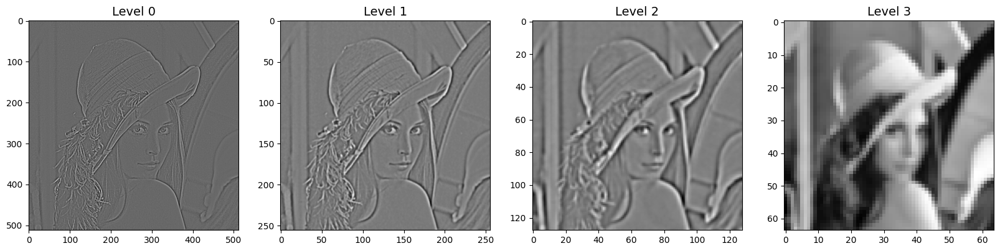

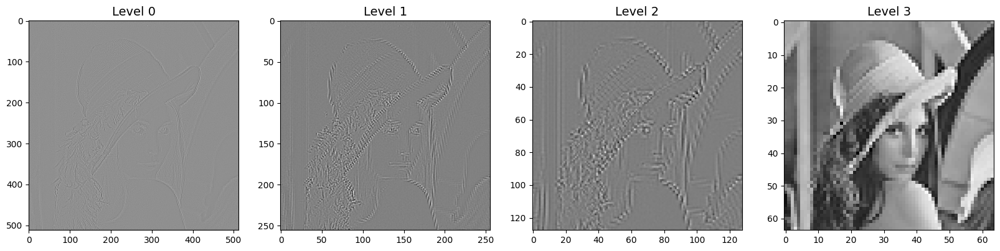

In [ ]:
showPyramid(lena_lap_pyr[0],"gray")
showPyramid(lena_lap_pyr[4],"gray")

c)

In [ ]:
#we will take one image that is Lena Y
a=3/8
lena_lap_pyr2=[]
decoded_lena2=[]
for depth_ in range(3,7):
  temp=LPyramid(myimages[1],a,depth_)
  lena_lap_pyr2.append(temp)
  decoded_lena2.append(L_Pyramid_Decode(temp,a))

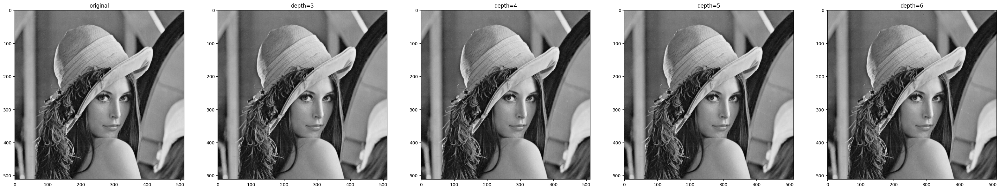

In [ ]:
fig,ax=plt.subplots(1,5,figsize=(40,40))
ax[0].set_title('original')
ax[0].imshow(myimages[1], cmap='gray')
for i in range(1,5):
  ax[i].set_title('depth='+str(i+2))
  ax[i].imshow(decoded_lena2[i-1], cmap='gray')

The number of levels we choose for our pyramid does not affect the final result of the decoded image. This image is a faithful reconstruction of the original. It changes the peak spectrum of the Laplacian pyramid, as the number of levels increases, so does the amount of deep filtering that has preceded it.

The more levels we use, the more intermediate sum images we use. For more levels the top of the pyramid is blurred and detail is added gradually during reconstruction

d)

In [ ]:
import scipy.stats as st

# Function that calculates histograms for a given pyramid and depth
def computeSumHist(LaplacianPyramid,depth):  
    sum_hist = np.zeros([256,1], np.float64)
    for n in range(depth-1):
        hist = cv2.calcHist(np.float32([LaplacianPyramid[n]]), [0], None, [256], [0, 256])       
        sum_hist += hist
    return sum_hist

# Function that calculates pyramid and histogram for a given value of parameter a and depth
def calcHist(Image,a,depth):  
    LaplacianPyramid=LPyramid(Image,a,depth)                                     
    sum_hist = computeSumHist(LaplacianPyramid,depth)                            
    return sum_hist

# Function showing histogram with values of parameter a in range [0.2, 0.7]
def ShowHistogramsFora (Image,depth):  
    final_sum_hist=[]                                                          
    entropy=[]
    variance=[]
    for i in range (2,8):
        i=i/10
        helper=calcHist(Image,i,depth)                                          
        a=np.max(helper)                                                         
        final_sum_hist.append(helper)           
        entropy.append(st.entropy(helper/a)[0])                                  
        variance.append(np.var(helper/a))                                        
    f, ax = plt.subplots(2, 3, figsize=(18, 7) ) 
    c=0.1
    for i in range (1,7):
        c += 0.1
        plt.subplot(2,3,i)
        plt.plot(final_sum_hist[i-1])                                            
        plt.title("Entropy = "+str(entropy[i-1])+" (a="+str(round(c,1))+")", fontsize=14) 
    return entropy,variance

# Function showing histograms with variable depth between [2,7]
def ShowHistogramsFordepth (Image,a):
    final_sum_hist=[]
    entropy=[]
    for i in range (2,8):
        helper=calcHist(Image,a,i)
        b=np.max(helper)
        final_sum_hist.append(helper)
        entropy.append(st.entropy(helper/b)[0])
    f, ax = plt.subplots(2, 3, figsize=(18, 7) )
    c=1
    for i in range (1,7):
        c += 1
        plt.subplot(2,3,i)
        plt.plot(final_sum_hist[i-1])
        plt.title("Entropy = "+str(entropy[i-1])+" (depth="+str(c)+")", fontsize=14)
    return entropy


In [ ]:
entropy_a=[]
variance_a=[]

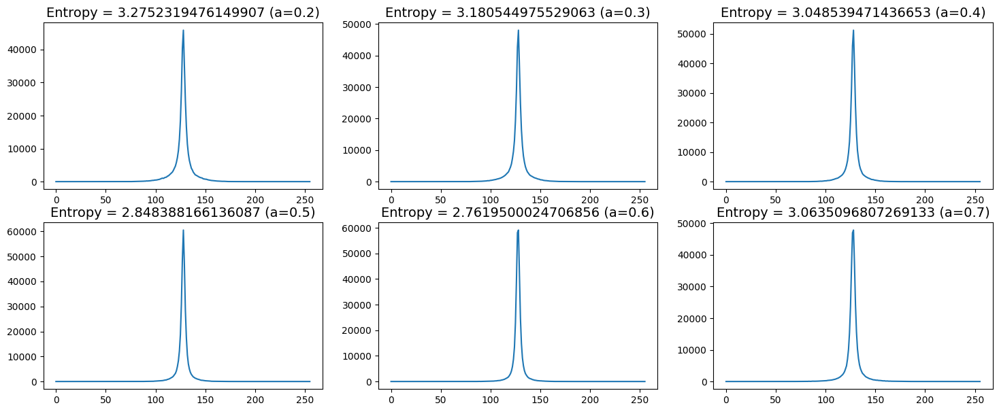

In [ ]:
entropy,variance=ShowHistogramsFora(myimages[0],5)
entropy_a.append(entropy)
variance_a.append(variance)
#we will find the entropies for the different values of a for our image lena RGB

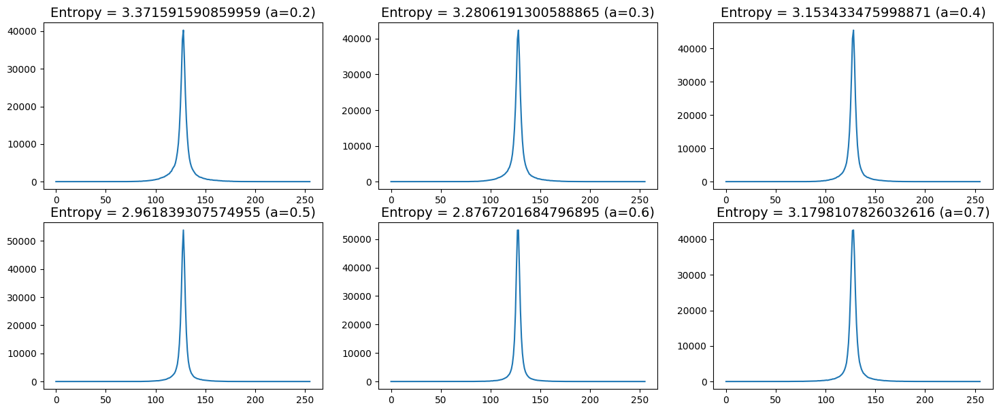

In [ ]:
entropy,variance=ShowHistogramsFora(myimages[1],5)
entropy_a.append(entropy)
variance_a.append(variance)
#we will find the entropies for the different values of a for our image lena Y

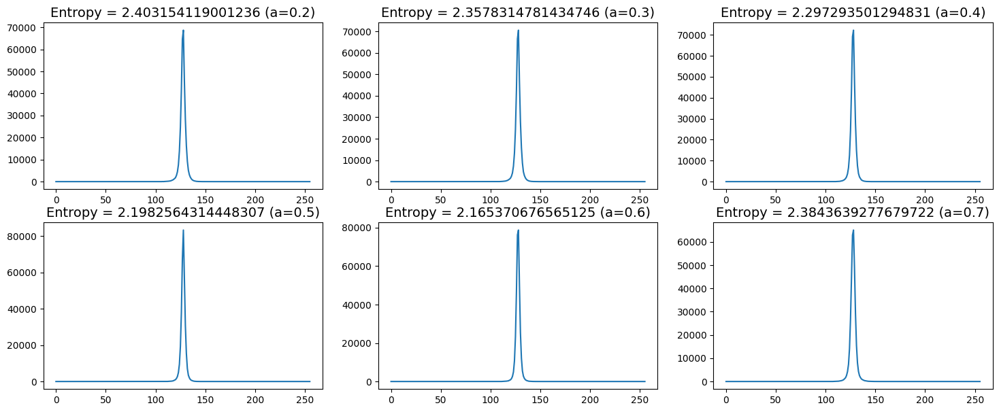

In [ ]:
entropy,variance=ShowHistogramsFora(myimages[2],5)
entropy_a.append(entropy)
variance_a.append(variance)
#we will find the entropies for the different values of a for our image lena Cr

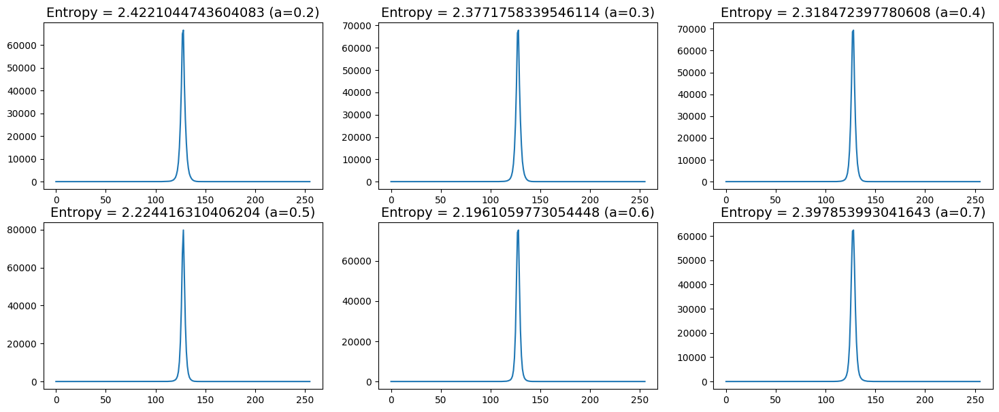

In [ ]:
entropy,variance=ShowHistogramsFora(myimages[3],5)
entropy_a.append(entropy)
variance_a.append(variance)
#we will find the entropies for the different values of a for our image lena Cb

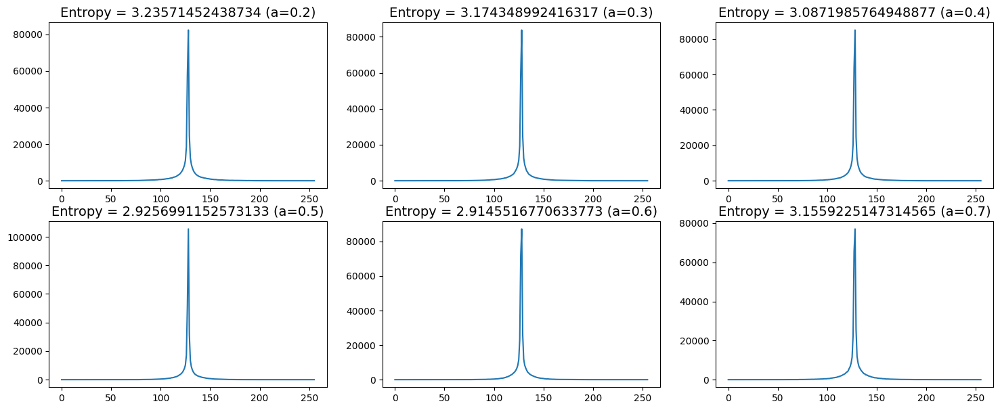

In [ ]:
entropy,variance=ShowHistogramsFora(myimages[4],5)
entropy_a.append(entropy)
variance_a.append(variance)
#we will find the entropies for the different values of a for our image camera

In [ ]:
def computeEntropyVariance (Image,depth,title):
    final_sum_hist=[]
    probs = [0.2,0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1]  # Πίνακας που αποθηκεύει τις τιμές του x άξονα
    entropy=[]
    variance=[]
    tmp=0
    for i in range (0,17):
        tmp=probs[i]
        helper=calcHist(Image,tmp,depth)                                         
        a=np.max(helper)                                                         
        final_sum_hist.append(helper/a)
        entropy.append(st.entropy(helper/a)[0])                                  
        variance.append(np.var(helper/a))                                        
    f, ax = plt.subplots(1, 2, figsize=(15, 4) ) 
    plt.subplot(1,2,1)
    plt.plot(probs, entropy, marker='.')                                         
    plt.title('Entropy of '+str(title)+' image')
    plt.xlabel('a')
    plt.ylabel('Entropy')
    plt.subplot(1,2,2)
    plt.plot(probs, variance, marker='.')                                        
    plt.title('Variance of '+str(title)+' image')
    plt.xlabel('a')
    plt.ylabel('Variance')
    plt.show()
    return entropy,variance

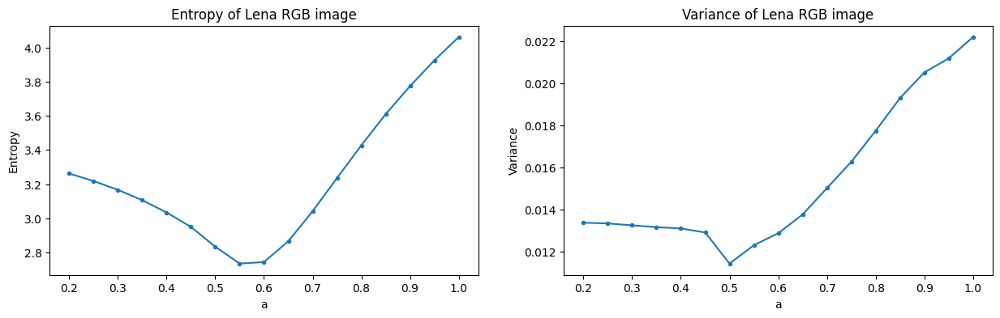

In [ ]:
_=computeEntropyVariance(myimages[0],4,"Lena RGB")

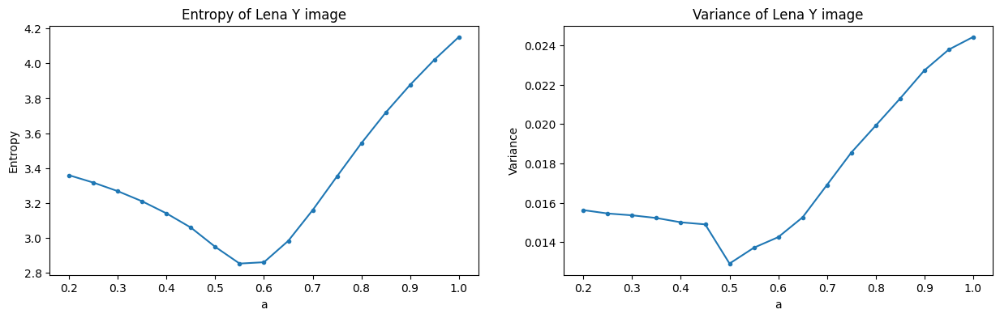

In [ ]:
_=computeEntropyVariance(myimages[1],4,"Lena Y")

The entropy shows a local minimum which varies depending on the image, remaining at a low level. This is expected given the pixel decorrelation of the Laplacian pyramid images. In any case, the local minima is entangled in the interval [0.6, 0.7] for the parameter a, which is consistent with the source of the pronunciation. We note that the variance does not follow a stable distribution. It shows a minimum for a = 0.5. So we conclude that for values in [0.5, 0.7] we can achieve quite low values in both entropy and variance. Thus, we are allowed to have a minimum number of bits/pixel needed to encode the image in question


In [ ]:
entropy_depth=[]

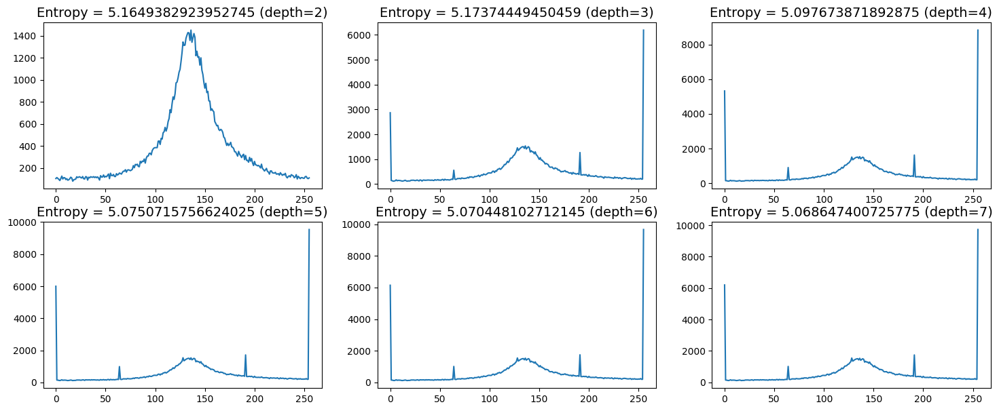

In [ ]:
entropy=ShowHistogramsFordepth(myimages[0],5)
entropy_depth.append(entropy)
#we will find the entropies for the different values of a for our image lena RGB

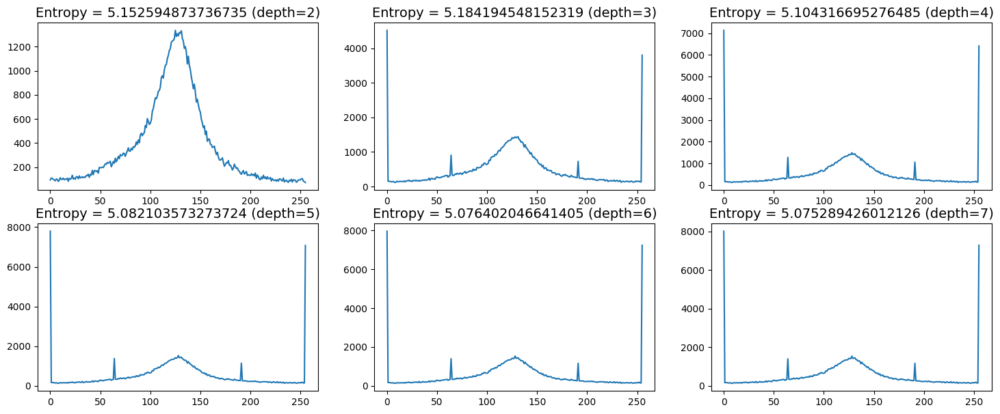

In [ ]:
entropy=ShowHistogramsFordepth(myimages[1],5)
entropy_depth.append(entropy)
#we will find the entropies for the different values of a for our image lena Y

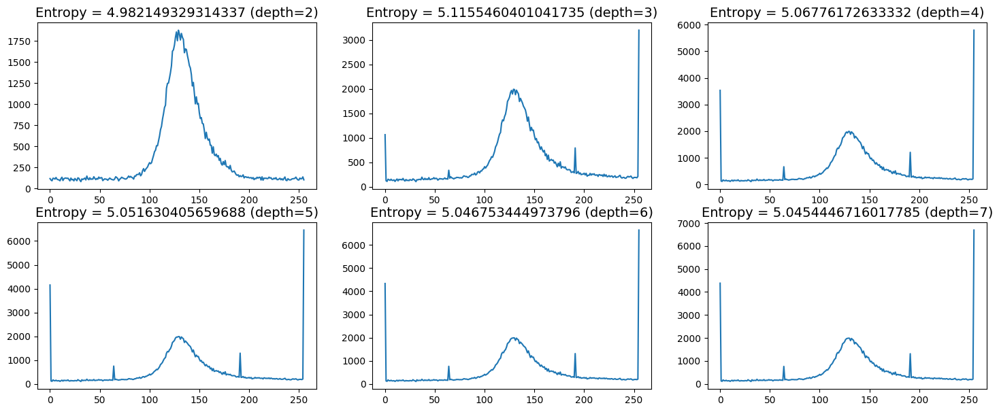

In [ ]:
entropy=ShowHistogramsFordepth(myimages[2],5)
entropy_depth.append(entropy)
#we will find the entropies for the different values of a for our image lena Cr

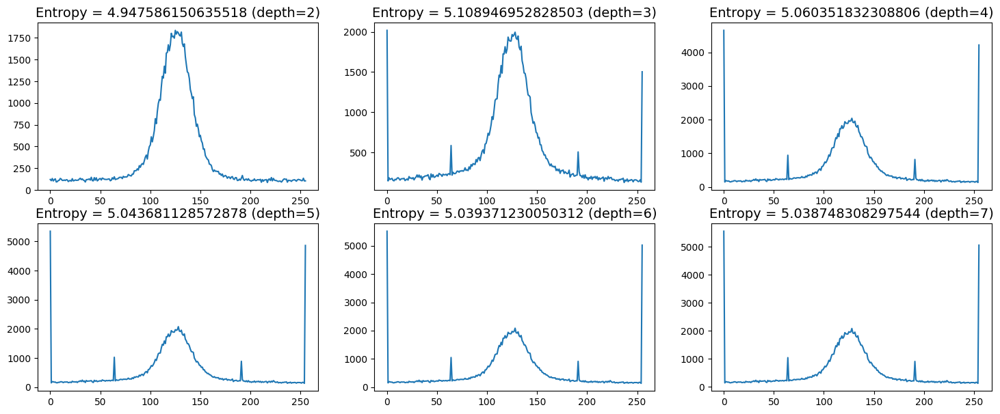

In [ ]:
entropy=ShowHistogramsFordepth(myimages[3],5)
entropy_depth.append(entropy)
#we will find the entropies for the different values of a for our image lena Cb

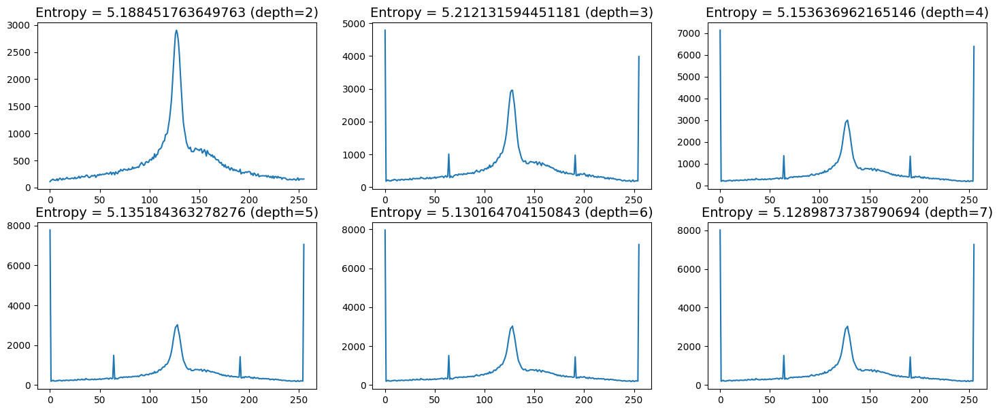

In [ ]:
entropy=ShowHistogramsFordepth(myimages[4],5)
entropy_depth.append(entropy)
#we will find the entropies for the different values of a for our image camera

In [ ]:

# Chart calculating the entropy for a given value of parameter a
def computeEntropyVarianceDepth (Image,a,title):
    entropy=[]
    probs=np.arange(2,8,1)                                                                    # Πίνακας που αποθηκεύει τις τιμές του x άξονα
    for i in range (2,8):
        helper=calcHist(Image,a,i)                                                            # Υπολογισμός ιστρογράμματος για συγκεκριμένο βάθος
        b=np.max(helper)                                                                      # Υπολογισμός μέγιστης τιμής του ιστογράμματος 
        entropy.append(st.entropy(helper/b)[0])                                               # Υπολογισμός εντροπίας για το κανονικοποιημένο ιστόγραμμα
    plt.plot(probs, entropy, marker='.')                                                      # Διαγραμμοποίηση εντροπίας
    plt.title('Entropy of '+str(title)+' image')
    plt.xlabel('depth')
    plt.ylabel('Entropy')
    return entropy


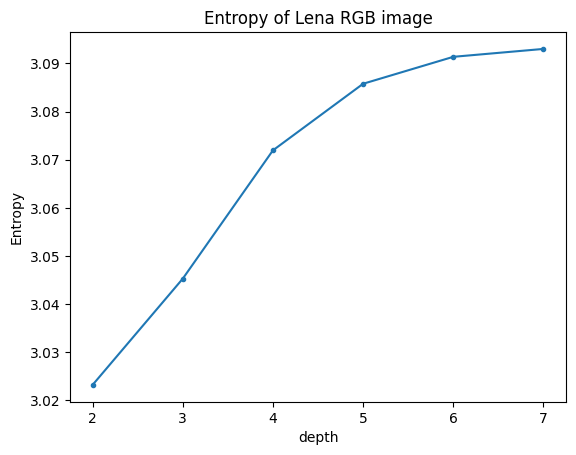

In [ ]:
_=computeEntropyVarianceDepth(myimages[0],3/8,"Lena RGB")


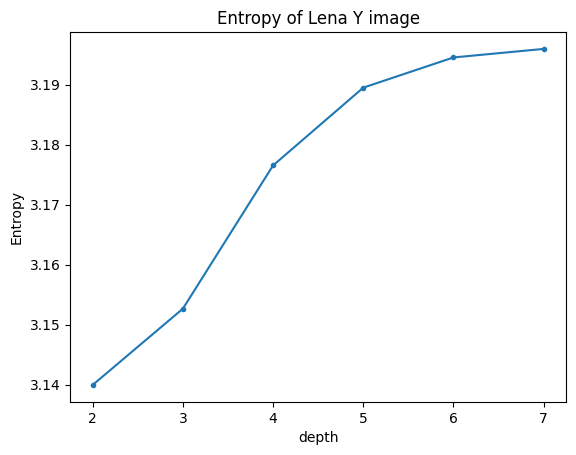

In [ ]:
_=computeEntropyVarianceDepth(myimages[1],3/8,"Lena Y")

The depth parameter does not greatly affect the entropy as we see that there is only a slight increase (of the order of decimal places). This leads us to the conclusion that the depth parameter is not a key criterion for minimizing entropy

e)

In [ ]:
# Constant c
const_c = 0.85
# Fixed basis for entropy
const_entropy_base = 2

# Similar function of sumHist
def listHist(Image,a,depth):
    LaplacianPyramid = LPyramid(Image,a,depth)
    list_hist = []
    for n in range(depth):
        hist = cv2.calcHist(np.float32([LaplacianPyramid[n]]), [0], None, [256], [0, 256])
        list_hist.append(hist)
    return list_hist

# Function to calculate entropy and variance from histograms
def histList2EntrAndVar(list_hist):
  entropy_list = list(map(lambda x: st.entropy(x)[0], list_hist))
  variance_list = list(map(lambda x: np.var(x/np.max(x)), list_hist))
  return entropy_list, variance_list

# Weighted average of the given list representing the levels of the Laplacian pyramid, each level weighted by the number of pixels (size)
def avgW(LPlayers_list):
  weighted_sum = 0
  l_len = len(LPlayers_list)
  for i in range (l_len):
    weighted_sum += LPlayers_list[l_len-1-i] * 4**i    # Αφού κάθε επίπεδο έχει 4 φορές το μέγεθος του προηγούμενου, τα βάρη είναι 1, 4, 16... ξεκινώντας από τη μικρότερη εικόνα 
  sum_of_weights = (4*4**(l_len-1)-1)/3
  return weighted_sum / sum_of_weights

# Given image, parameter a, depth return AvgEntropy and AvgVariance
def avgEnVar(Image,a,depth):
  hists = listHist(Image,a,depth)
  entropy_l, variance_l = histList2EntrAndVar(hists)
  return avgW(entropy_l), avgW(variance_l)

def range_with_floats(start, stop, step):
    while stop > start:
        yield start
        start += step

def cost(Image, a_start, a_step, a_end, depth, title):
  a_list = []
  var_list = []
  en_list = []
  cost_list = []
  for a in range_with_floats(a_start, a_end, a_step):
    en, var = avgEnVar(Image,a,depth)
    en_list.append(en)
    var_list.append(var)
    a_list.append(a)

  en_norm = np.max(en_list) - np.min(en_list)
  var_norm = np.max(var_list) - np.min(var_list)

  for i in range(len(a_list)):
    cost_list.append(const_c*en_list[i]/en_norm + (1-const_c)*var_list[i]/var_norm)

  # Σχεδιασμός/Διαγράμματα
  f, ax = plt.subplots(1, 3, figsize=(12, 4))
  plt.subplot(1,3,1)
  plt.plot(a_list, en_list, marker='.')
  plt.title('Entropy of '+str(title)+' image')
  plt.xlabel('a')
  plt.ylabel('Entropy')
  plt.subplot(1,3,2)
  plt.plot(a_list, var_list, marker='.')
  plt.title('Variance of '+str(title)+' image')
  plt.xlabel('a')
  plt.ylabel('Variance')
  plt.subplot(1,3,3)
  plt.plot(a_list, cost_list, marker='.')
  plt.title('Cost of '+str(title)+' image')
  plt.xlabel('a')
  plt.ylabel('Cost Function')
  return cost_list, a_list


def presentation_e(Image, a_start, a_step, a_end, depth, title):
  costs, a_list = cost(Image, a_start, a_step, a_end, depth, title)
  min_pos = np.argmin(costs)
  print("Minimum Cost for " + title + " is:\n" + str(costs[min_pos]) + " at a=" + str(np.round(a_list[min_pos], decimals=3)))

Minimum Cost for Lena RGB is:
6.017205224090775 at a=0.57
Minimum Cost for Lena Y is:
6.500496623077856 at a=0.57
Minimum Cost for Camera Gray is:
10.015924774180277 at a=0.57


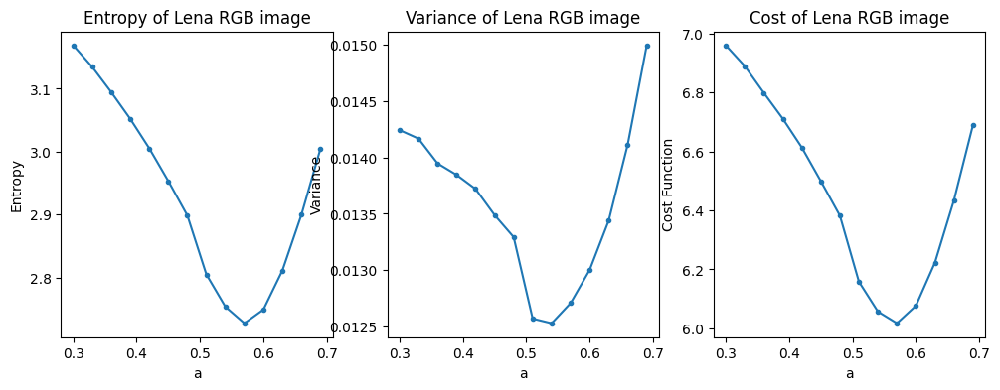

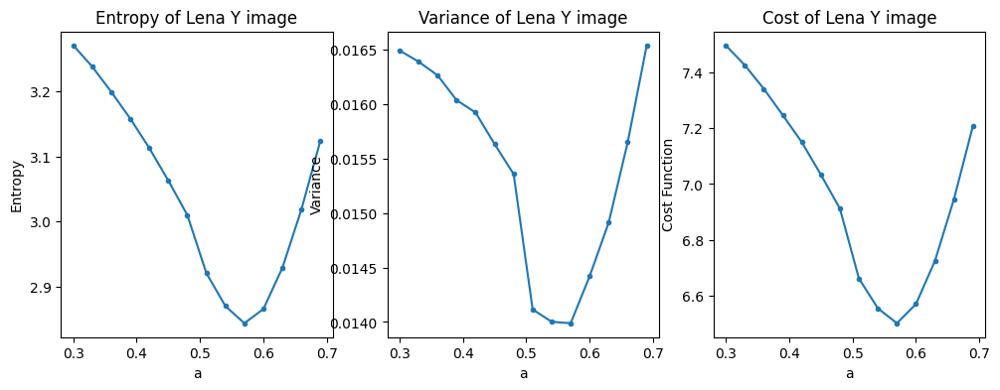

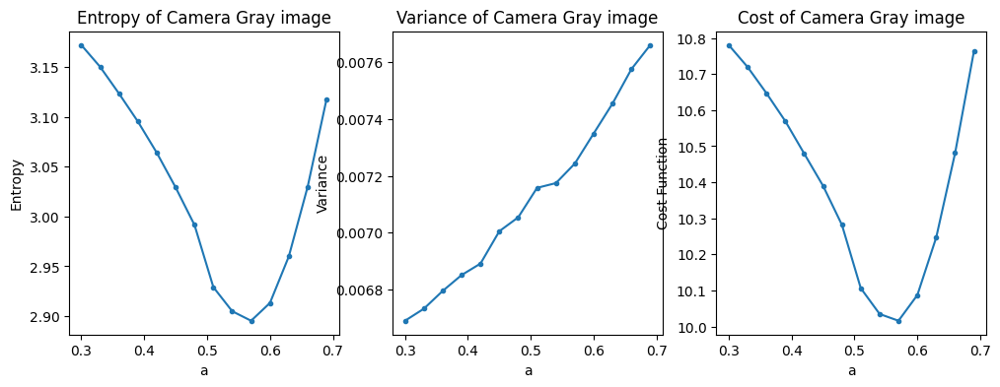

In [ ]:
presentation_e(myimages[0], 0.3, 0.03, 0.7, 9, "Lena RGB")
     

presentation_e(myimages[1], 0.3, 0.03, 0.7, 9, "Lena Y")
     

presentation_e(myimages[4], 0.3, 0.03, 0.7, 9, "Camera Gray")

st)

In this question we implement three quantum subfunctions for the corresponding experiments. Our source states that at higher levels we should have a smaller bin size. The reason for this is that human sensitivity to errors in the information being encoded is high. For the choice of bin size we choose the value where the degradation in quality is just beginning to be seen compared to the unquantized image for that level. With an observer distance of five times the width of the image. We perform three experiments to test the proposed method.

Bin size such that the degradation at each level is just visible.
Bin size such that the degradation is more pronounced at each level.
Bin size such that the quantization levels are more and the visual degradation is not obvious.

In [ ]:
# Function to calculate the quantized pyramid of the first experiment
def firstExp(pyramid):
    quantized_lap=[]
    bin_sizes=len(pyramid) 
    bins=[14,23,40,45,48]                                                                # Bin sizes για το πρώτο πείρμαμα
    for i in range (0, bin_sizes):    
        image_quantized=L_Quantization(pyramid[i],bins[i])                               # Υπολογισμός κβαντισμένης πυραμίδας
        quantized_lap.append(image_quantized)  
    return quantized_lap
     

# Function to calculate the quantized pyramid of the second experiment
def secondExp(pyramid):
    quantized_lap=[]
    bin_sizes=len(pyramid)  
    bins=[8,14,22,26,27]                                                                 # Bin sizes για το δεύτερο πείραμα
    for i in range (0, bin_sizes):    
        image_quantized=L_Quantization(pyramid[i],bins[i])                               # Υπολογισμός κβαντισμένης πυραμίδας
        quantized_lap.append(image_quantized)  
    return quantized_lap
     

# Function to calculate the quantized pyramid of the third experiment
def thirdExp(pyramid):
    quantized_lap=[]
    bin_sizes=len(pyramid) 
    bins=[25,40,58,64,65]                                                                # Bin sizes για το τρίτο πείραμα
    for i in range (0, bin_sizes):    
        image_quantized=L_Quantization(pyramid[i],bins[i])                               # Υπολογισμός κβαντισμένης πυραμίδας
        quantized_lap.append(image_quantized)  
    return quantized_lap

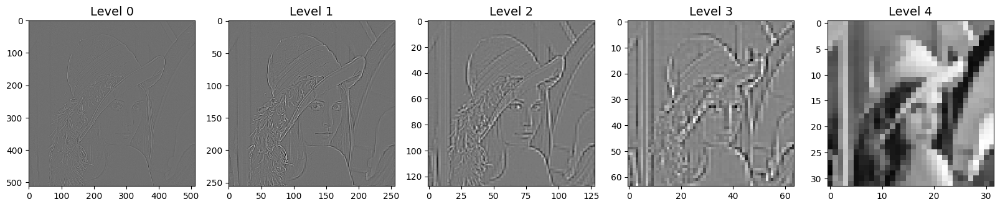

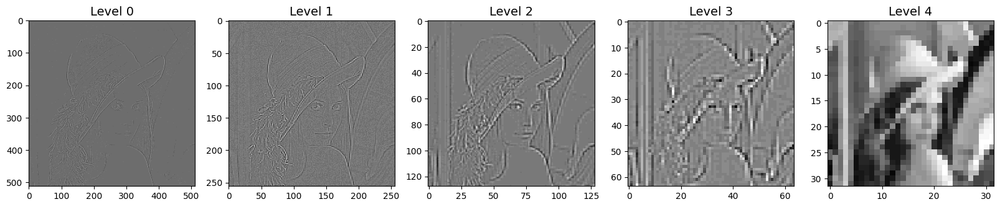

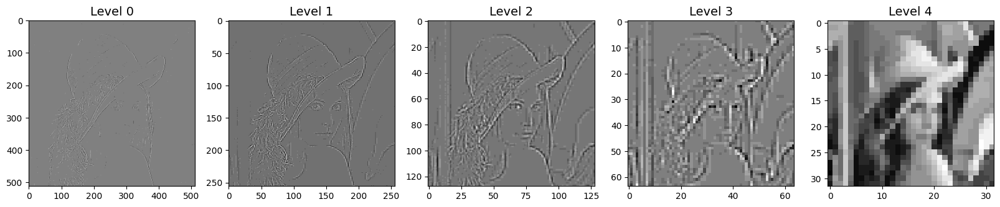

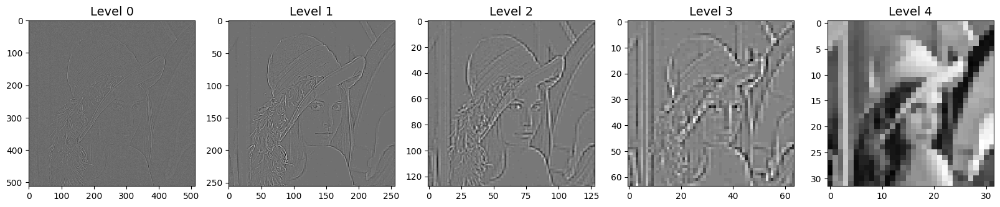

In [ ]:
# Original pyramid
Lena_gray_lap=LPyramid(myimages[1],0.57,5)
showPyramid(Lena_gray_lap, 'gray')
# First experiment
Lena_gray_lap_quant_first=firstExp(Lena_gray_lap)
showPyramid(Lena_gray_lap_quant_first, 'gray')
# Second experiment
Lena_gray_lap_quant_second=secondExp(Lena_gray_lap)
showPyramid(Lena_gray_lap_quant_second, 'gray')
# Third experiment
Lena_gray_lap_quant_third=thirdExp(Lena_gray_lap)
showPyramid(Lena_gray_lap_quant_third, 'gray')

We then present the original image together with the reconstructed image obtained after decoding the above, for visual comparison.

In [ ]:
# Function to list the reconstructed image next to the original one
def showExperimentsDecoded(original,quant_f,quant_s,quant_t,a,type):
    quantized=[quant_f,quant_s,quant_t]                                          # Λαμβάνει ως είσοδο την κβαντισμένη εικόνα των τριών πειραμάτων
    exp=["first","second","third"]
    Decoded=[]
    for i in range (3):
        Decoded.append(L_Pyramid_Decode(quantized[i],a))                         # Αποκωδικοποίηση κάθε κβαντισμένης εικόνας
        f1, (ax0,ax1)= plt.subplots(1, 2, figsize=(10, 10))
        if (type=="gray"):                                                       # Αν η εικόνα είναι Grayscale
            ax0.imshow(Decoded[i], cmap="gray")                                  # Σχεδιασμός ανακατασκευασμένης εικόνας
            ax0.set_title('Reconstructed from '+str(exp[i])+" experiment", fontsize=10)
            ax1.imshow(original, cmap="gray")                                    # Σχεδιασμός αρχικής εικόνας
            ax1.set_title('Original', fontsize=10)
        else:                                                                    # Αν η εικόνα είναι RGB
            ax0.imshow(Decoded[i].astype(int))                                   # Σχεδιασμός ανακατασκευασμένης εικόνας
            ax0.set_title('Reconstructed', fontsize=14)
            ax1.imshow(original)                                                 # Σχεδιασμός αρχικής εικόνας
            ax1.set_title('Original', fontsize=14)
    return Decoded

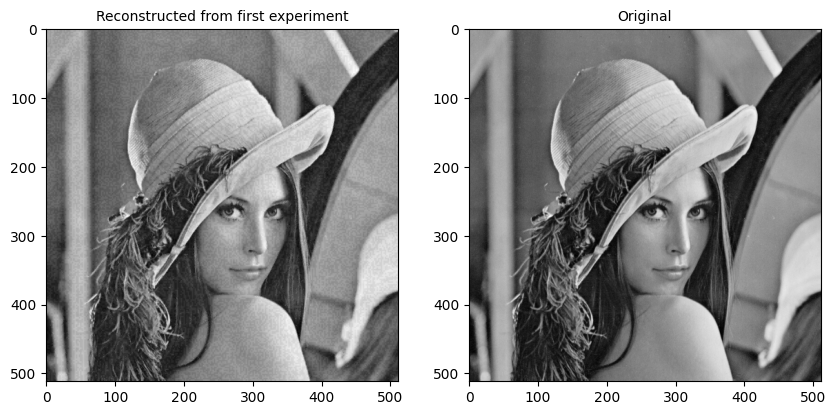

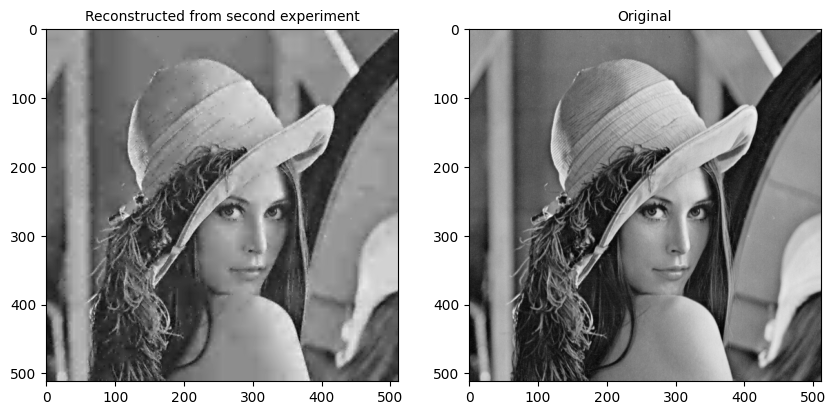

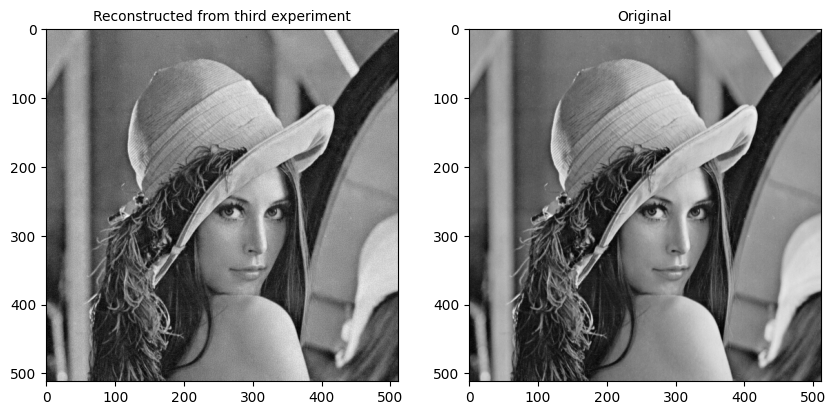

In [ ]:
Lena_gray_decoded=showExperimentsDecoded(myimages[1],Lena_gray_lap_quant_first,Lena_gray_lap_quant_second,Lena_gray_lap_quant_third,0.57,'gray')



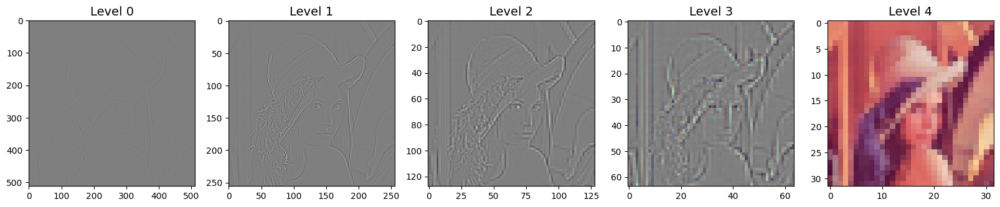

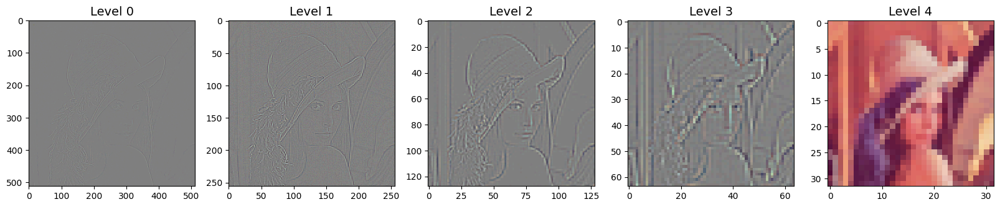

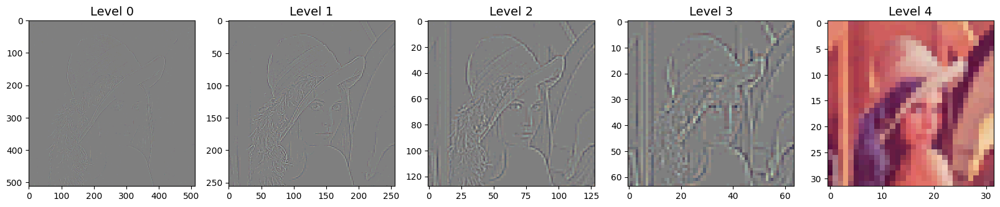

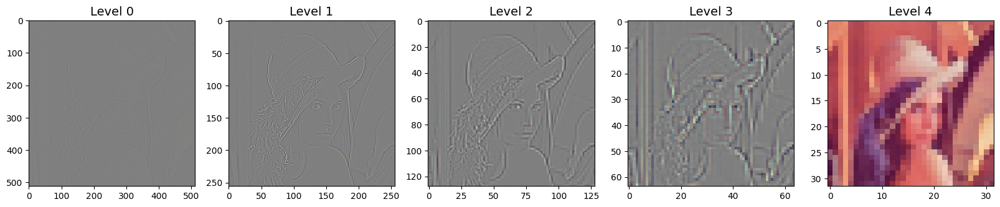

In [ ]:
     

Lena_rgb_lap=LPyramid(myimages[0],0.57,5)
showPyramid(Lena_rgb_lap, 'RGB')

Lena_rgb_lap_quant_first=firstExp(Lena_rgb_lap)
showPyramid(Lena_rgb_lap_quant_first, 'RGB')

Lena_rgb_lap_quant_second=secondExp(Lena_rgb_lap)
showPyramid(Lena_rgb_lap_quant_second, 'RGB')

Lena_rgb_lap_quant_third=thirdExp(Lena_rgb_lap)
showPyramid(Lena_rgb_lap_quant_third, 'RGB')

     

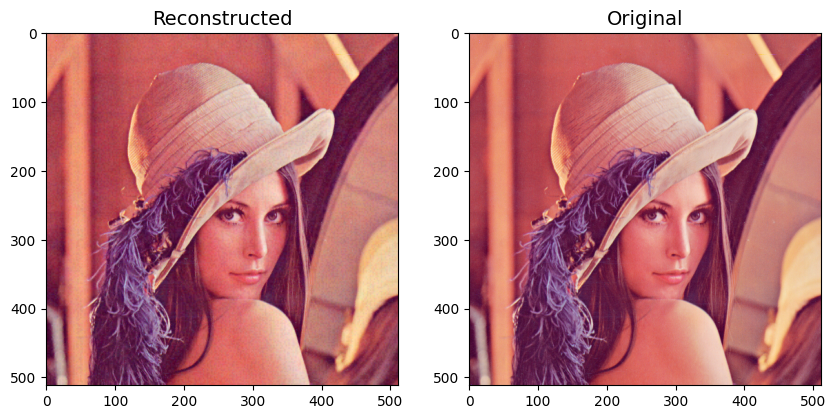

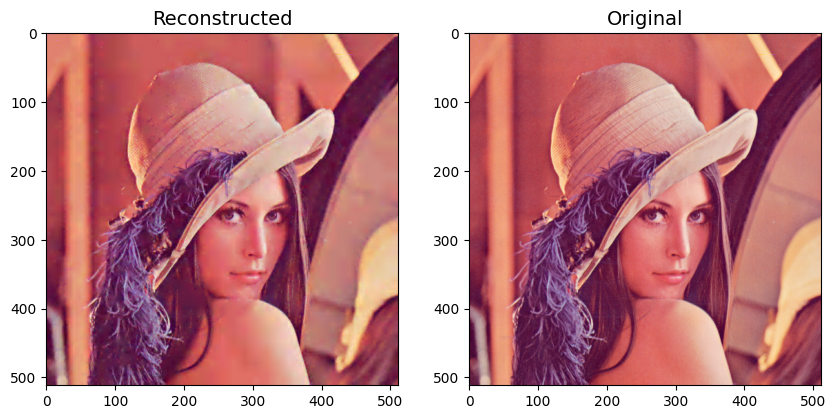

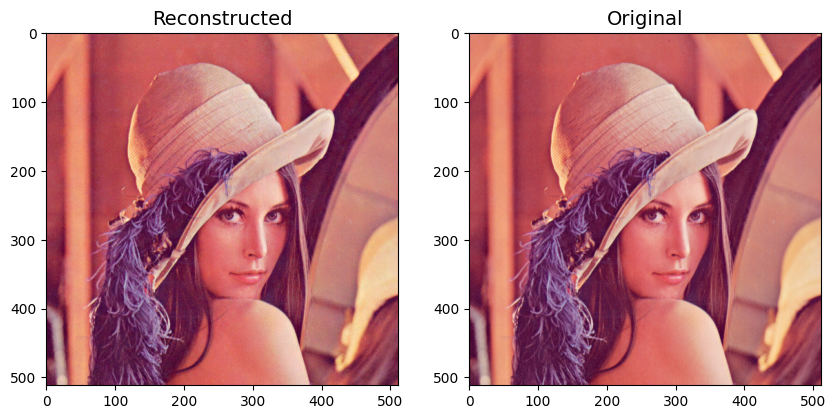

In [ ]:

Lena_rgb_decoded=showExperimentsDecoded(myimages[0],Lena_rgb_lap_quant_first,Lena_rgb_lap_quant_second,Lena_rgb_lap_quant_third,0.57,'rgb')
     

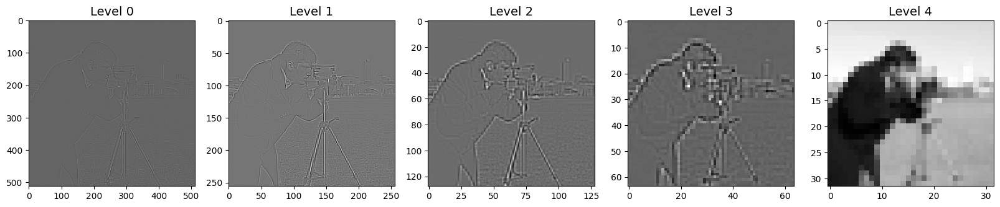

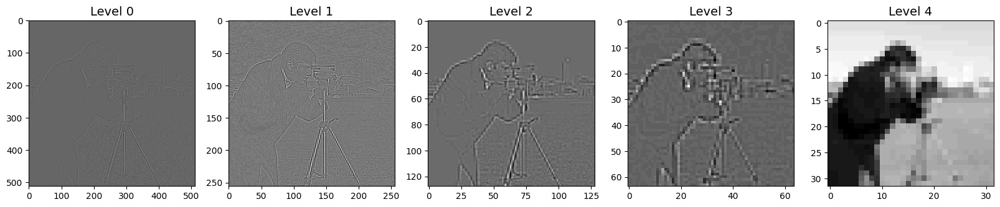

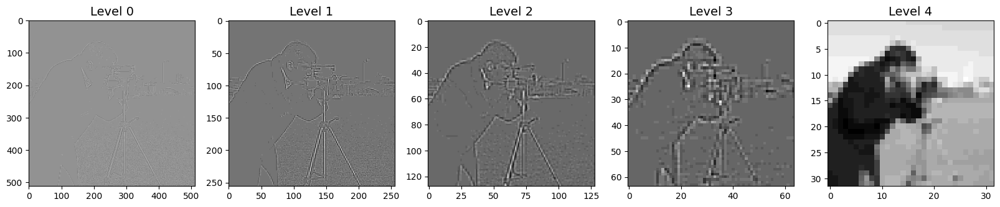

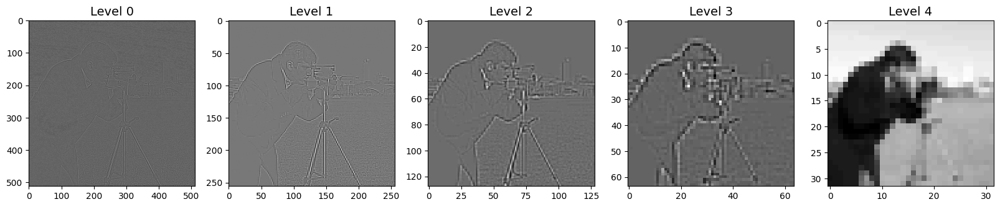

In [ ]:
Camera_gray_lap=LPyramid(myimages[4],0.57,5)
showPyramid(Camera_gray_lap, 'gray')

Camera_gray_lap_quant_first=firstExp(Camera_gray_lap)
showPyramid(Camera_gray_lap_quant_first, 'gray')

Camera_gray_lap_quant_second=secondExp(Camera_gray_lap)
showPyramid(Camera_gray_lap_quant_second, 'gray')

Camera_gray_lap_quant_third=thirdExp(Camera_gray_lap)
showPyramid(Camera_gray_lap_quant_third, 'gray')

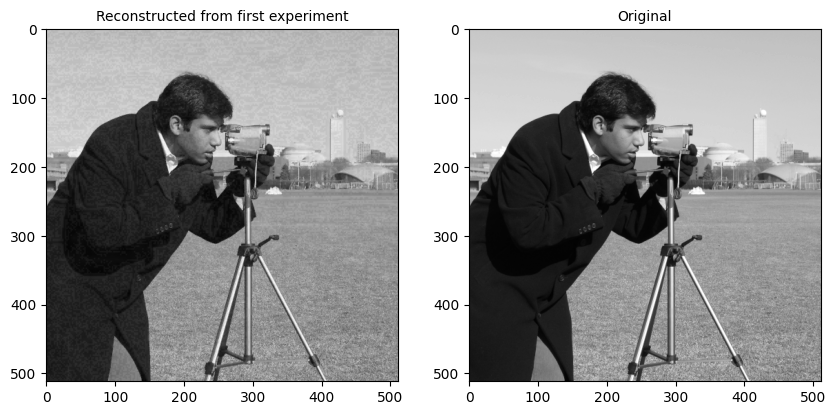

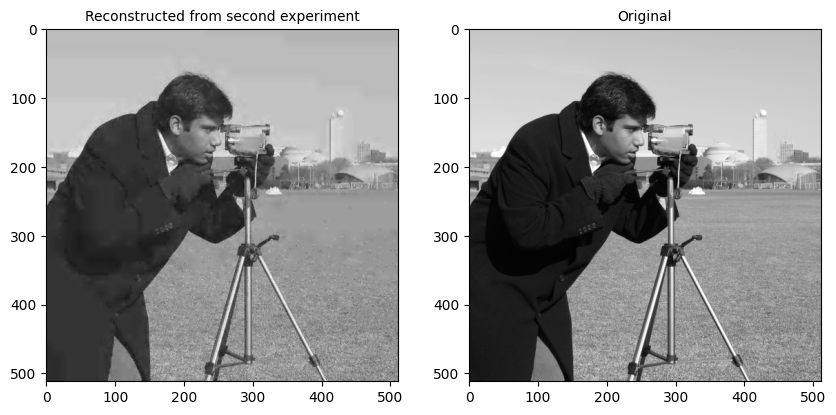

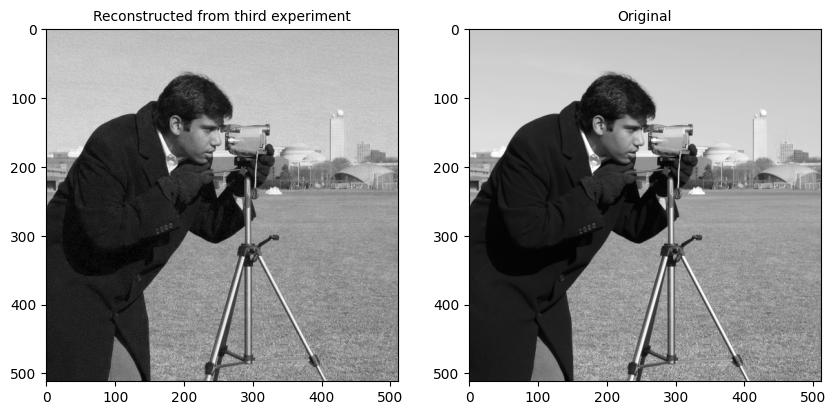

In [ ]:
Camera_decoded=showExperimentsDecoded(myimages[4],Camera_gray_lap_quant_first,Camera_gray_lap_quant_second,Camera_gray_lap_quant_third,0.57,'gray')


We note the following:

In the first experiment, where the bin size in each plane is such that the visual differentiation is barely discernible, we obtain reconstructed images with quite good quality compared to the original. The edges are evident as are the other features of the image. In the reconstruction there is a relative degradation in colour.
In the second experiment, with bin size considerably larger, the visual effect of the reconstruction is lower. The edges and the image in general appear more blurred. This is expected due to the more pronounced quantization.
In the third experiment, with bin size smaller than in the previous experiments, the result is highly improved. The reconstructed image is comparable to the original one.
In any case, the reconstructed image is of relatively good quality. Thus, the benefit of Laplacian pyramid is established. This method allows us to quantize more intensely and reduce the bits/pixel while maintaining the image quality.